This notebook illustrates two blogposts (in French) :
- "Peut-on toujours atteindre une maternité en 30 minutes ?" https://www.smalsresearch.be/peut-on-toujours-atteindre-une-maternite-en-30-minutes/
- [Blog post to be published in September 2021]

Requires same packages as in "Spatial_Join" notebook, plus : 
    
    - conda install -c conda-forge dash
    - conda install -c conda-forge -c plotly jupyter-dash
    - conda install descartes
    - conda install openpyxl
    - conda install -c conda-forge flexpolyline
    - conda install -c conda-forge python-kaleido


In [1036]:
%matplotlib inline

In [1037]:
import urllib
import time
import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.geometry import Polygon
import contextily as ctx
import shapely
from shapely.geometry import shape
from pyproj import CRS

import os

import requests

import matplotlib.pyplot as plt

from tqdm.auto import tqdm, trange
import json
tqdm.pandas()

In [1038]:
import shapely
import plotly.express as px
import dash
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
import plotly.graph_objects as go

import flexpolyline as fp


In [1039]:
from credentials import here_api_key, here_app_code, here_app_id

In [1040]:
crs =     'epsg:3857'
osm_crs=  'epsg:4326'

In [1041]:
try : os.mkdir("output")
except FileExistsError: pass

In [1042]:
from_files = False 
# If False, Here API is called for geocoding and isolines, and result is stored in a file
# If True, API is not called, data is retreived from the file and plots are produced

In [1043]:
add_options={}
option=None

In [1044]:
# dataset=  "smur"
dataset = "maternity"
# dataset = "vaccin"

In [1045]:
# Uncomment to two following lines to add traffic
# add_options = {"departureTime" : "2021-05-28T14:00:00+01:00"} # with heavy traffic
# option="traffic"
# # Could also be {"transportMode":"pedestrian"}

# Functions

## Geocoding

In [1046]:
def get_geocode(addr):
    """
    Geocode an address with Here API

    Parameters
    ----------
    addr: str
       address to geocode
    filename: str
       local file to save

    Returns
    -------

    (lat, lon): (float, float)
        geographical coordinates (in epsg:4326)
    """

    host_name = "geocoder.api.here.com"
    
    params = urllib.parse.urlencode({"app_id": here_app_id,
                                     "app_code": here_app_code,
                                    "searchtext":addr,
                                    })
    
    url = f"https://{host_name}/6.2/geocode.json?{params}"
    
#     print(url)
    with urllib.request.urlopen(url) as response:
        res = response.read()
        res = json.loads(res)
        r = res["Response"]["View"][0]["Result"][0]["Location"]["DisplayPosition"]
        return r["Latitude"], r["Longitude"]

In [1047]:
def geocode_points(starts):
    """
    Geocode all addresses in a geopandas GeoDataFrame. Add columns "lat", "lon" (in epsg:4326), 
    as well as "geometry" (in epsg:3857)

    Parameters
    ----------
    starts: geopandas.GeoDataFrame
       a dataframe which contains a column "address"

    Returns
    -------
        geopandas.GeoDataFrame, with 3 additionnal columns : "lat", "lon", and "geometry"
    """
    starts[["lat", "lon"]] = starts.address.progress_apply(get_geocode).apply(pd.Series)
    # Convert lat/long in xy points
    starts= starts.set_geometry(gpd.points_from_xy(x = starts["lon"], y=starts["lat"]))
    
    # Set CRS
    starts.crs = CRS(osm_crs)
    starts = starts.to_crs(CRS(crs))
    return starts

## Isolines

In [1048]:
def get_isoline(lat, lon, range_list, add_options={}):
    """
    Get isolines 'lat, lon' as origin points, for all delays given in 'range_list' in minutes.
    Call Here isoline API, with some default parameters that can be overwritten or enriched with 'add_options'

    If 'Too Many Requests' error is received from Here, wait for 15 seconds and retries
    
    Parameters
    ----------
    lat: float
        Latitude (in epsg:4326)
    lon: float
        Longitude (in epsg:4326)
    range_list: list
        List of range values (in minutes)
    add_options : dict
        Example:  {"departureTime" : "2021-05-28T14:00:00+01:00", "transportMode":"pedestrian"}
    
    Returns
    -------
        A dict, with keys from range_list, and data is a list of coordinates tuple. 
        Example : 
            {10.0: [(50.818634, 4.257374),
                    (50.818291, 4.258232),
                    (50.817604, 4.258919),
                    (...)],
             15.0: (50.821381, 4.266815),
                   (50.821037, 4.267845),
                   (50.820351, 4.268532),
                   (...)]}
    """

    
    host_name = "isoline.router.hereapi.com"
    
    
    params = {"apiKey": here_api_key,
                "transportMode":f"car", 
                "departureTime":"any", # No traffic dependent
                "origin" : f"{lat},{lon}",
                "range[values]" :",".join([str(rng*60) for rng in range_list]),
                "range[type]":"time"#  "distance"
                }
    for k in add_options:
        params[k] = add_options[k]
        
    params = urllib.parse.urlencode(params)
    
    url = f"https://{host_name}/v8/isolines?{params}"
    
#     print(url)
    try: 
        with urllib.request.urlopen(url) as response:
            res = response.read()
            res = json.loads(res)
#             print(res)
    #         return res
            for it in res["isolines"]:
                if len(it["polygons"]) != 1:
                    print("More than 1 polygon!!")

            return {it["range"]["value"]/60: fp.decode(it["polygons"][0]["outer"]) for it in res["isolines"]} #["isoline"][0]["component"][0]["shape"]
    except urllib.error.HTTPError as ex:
        if ex.getcode() == 429:  #Too Many Requests
            print("Too many requests, wait for 15 seconds...")
            time.sleep(15)
            return get_isoline(lat, lon, range_list)
        else:
            print(ex)
            print(type(ex))
            print(url)
            return None

In [1049]:
# get_isoline(50.83458, 4.33639, [10])

In [1050]:
def get_isolines(starts, range_list, add_options={}):
    """
    From the output of geocode_points(starts), call get_isoline for each record, with range_list and add_options as parameter.
    
    Note: does NOT support multi-component isolines (https://developer.here.com/documentation/isoline-routing-api/8.4.0/dev_guide/topics/multi-component-isoline.html)
    
    Parameters
    ----------
    start: geopandas.GeoDataFrame
        output of geocode_points(starts)
    range_list: list
        list of range values (in minutes)
    add_options : dict
        Example:  {"departureTime" : "2021-05-28T14:00:00+01:00", "transportMode":"pedestrian"}
    
    Returns
    -------
    geopandas.GeoDataFrame
        A geopandas.GeoDataFrame, with starts.shape[0] * len(range_list) record. For each starting point and each range, 
        "geometry" columns is a polygon with the corresponding isoline
        

    """

    isolines= starts.copy()
    isolines["isolines"] = isolines.progress_apply(lambda row: get_isoline(row["lat"], row["lon"], range_list, add_options), axis=1)
    
    

    for rng in range_list:
        isolines[rng] = isolines["isolines"].apply(lambda x: x[rng])
    
    isolines =  isolines.drop(["geometry", "isolines"], axis=1)
    cols= isolines.drop(range_list, axis=1).columns
    
    isolines = isolines.set_index(list(cols)).stack().rename("isoline").reset_index().rename(columns={"level_7": "range",
                                                                                                      "level_8": "range",
                                                                                                      "level_9": "range",
                                                                                                     })

    # Convert isolines to polygons
    isolines["geometry"] = isolines["isoline"].apply(lambda row:Polygon(map(lambda tpl: (tpl[1], tpl[0]), row)))
    isolines = isolines.set_geometry("geometry")

    isolines.crs = CRS(osm_crs)
    isolines = isolines.to_crs(CRS(crs))
    return isolines.drop("isoline", axis=1)

In [1051]:
def get_isolines_grouped(isolines, subsets):
    """
    From the output of get_isolines(starts), group all isolines for the same range, making a (multi)polygon from all the 
    (single starting points) polygons
    
    Parameters
    ----------
    isolines: geopandas.GeoDataFrame
        output of get_isolines
    subsets: list
        list of scenarii (corrsponding to boolean columns in isolines dataframe)
    
    Returns
    -------
    geopandas.GeoDataFrame
        A geopandas.GeoDataFrame, with len(subsets) * len(range_list) record. For each scenario point and each range, 
        "geometry" columns is a (mutli)polygon with the corresponding reachable region

    """

    
    isolines_grouped = []
    for subset in subsets:
        gr = isolines[isolines[subset]].groupby("range").apply(lambda bloc: bloc.unary_union).rename("geometry").reset_index()
        gr["subset"]=subset
        isolines_grouped.append(gr)
        
    isolines_grouped = gpd.GeoDataFrame(pd.concat(isolines_grouped))
    isolines_grouped.crs = CRS(crs)

    isolines_grouped["label"] = isolines_grouped.apply(lambda x: f"{x['subset']} ({x['range']})", axis=1)
    
    return isolines_grouped

In [1052]:
# get_isolines_grouped(isolines, subsets)

## Plot

In [1053]:
def add_basemap(ax):
    """
    Add a basemap on a plot. Tries first default (Stamen) basemap. If errors, tries OpenStreetMap.Mapnik
    
    Parameters
    ----------
    ax: matplotlib axes
    
    Returns
    -------
        None
    """

    try: 
        ctx.add_basemap(ax)
    except requests.HTTPError:
        print("Default basemap doesn't work...")
        ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

In [1054]:
def disjoin_labels(geo_df):
    """
    From the output of get_isolines_grouped, filtred on a unique range (we should then have len(subsets) records, 
    extract the overlapping regions.
    
    Example :
     geo_df= [["subs1", geom1],
              ["subs2", geom2]]
    if geom2 in full included in geom1, output will be: 
        [["subs1",          geom1-geom2],
         ["all scenarii",   geom2]]
         
    if there is an ovelapping region "common":
        [["subs1",        geom1-common],
         ["subs2",        geom2-common],
         ["all scenarii", common]]
    
    If more than 2 subsets, extracts also overlappings two by two
    Parameters
    ----------
    geo_df: geopandas.GeoDataFrame
    
    Returns
    -------
        None
    """

    ## Find global common zone (common to all zones)
    
    common_zone =  geo_df.iloc[[0]]
    
    for i in range(1, geo_df.shape[0]):
        common_zone = gpd.overlay(common_zone, 
                              geo_df.iloc[[i]], 
                              how="intersection", 
                              keep_geom_type=False)
    common_zone = common_zone.geometry
    
    if common_zone.shape[0]>0:
        common_zone_s = gpd.GeoSeries([common_zone.iloc[0] for it in geo_df.iterrows()])
        common_zone_s.crs= geo_df.crs


        geo_df = geo_df.reset_index(drop=True).copy()

        geo_df["common_zone"] = common_zone_s
        try: 
            geo_df["geometry"]= geo_df.geometry.difference(geo_df["common_zone"])#.plot()
        except shapely.errors.TopologicalError as e:
            print(e)
            print("Trying with buffer(0)...")
            geo_df["geometry"]= geo_df.geometry.buffer(0).difference(geo_df["common_zone"])
            
            #return geo_df#.drop("common_zone", axis=1)

        m_range =  geo_df.range.iloc[0]

        geo_df = geo_df.append({"subset": "all scenarii", 
                                "label" : f"all scenarii ({m_range})", 
                                "geometry":common_zone.iloc[0], 
                                "range": m_range,
                               "reach_ratio":0 # not correct!
                               }, ignore_index=True).drop("common_zone", axis=1).copy()
    ## Find one2one (remaining) overlaps (only if len(subsets)>2)
    
    sh = geo_df.shape[0]
    for i in range(sh):
        for j in range(i+1, sh):
            
            common_zone = geo_df.iloc[i].geometry.intersection(geo_df.iloc[j].geometry)
            
            if geo_df.iloc[i].geometry.area > 0 and common_zone.area/geo_df.area.max() > 0.01:
                
                geo_df["geometry"].iloc[i] = geo_df.iloc[i].geometry.difference(common_zone)
                geo_df["geometry"].iloc[j] = geo_df.iloc[j].geometry.difference(common_zone)
                
                geo_df = geo_df.append({"subset": f"{geo_df.iloc[i].subset} + {geo_df.iloc[j].subset}", 
                                "label" : f"{geo_df.iloc[i].subset} + {geo_df.iloc[j].subset} ({m_range})", 
                                "geometry":common_zone, 
                                "range": m_range,
                               "reach_ratio":0 # not correct!
                               }, ignore_index=True).copy()
                #common_zone.plot()
            
    geo_df = geo_df[~geo_df.geometry.is_empty & (geo_df.area/geo_df.area.max() > 0.01)]
    return geo_df

In [1055]:
# from matplotlib import cm
from matplotlib.colors import ListedColormap
def plot_isolines(isolines_grouped, starts, m_range, boundary):
    
    geo_df = isolines_grouped[(isolines_grouped.range == m_range)]
    
    geo_df = disjoin_labels(geo_df).sort_values("label")
#     display(geo_df)
    cmap =    ListedColormap( [f"C{i}" for i in range(geo_df.label.nunique())])
    cmap_st = ListedColormap( [f"C{i}" for i in range(starts.label.nunique())])
    
    ax=  geo_df.plot("label", alpha=0.2, figsize=(10, 10), cmap=cmap)
    ax = geo_df.plot("label", ax=ax, facecolor="none", edgecolor="k", cmap=cmap, legend=True)
    
    starts.sort_values("label").plot("label", ax=ax, cmap=cmap_st)
    boundaries.boundary.plot(ax=ax, color="black")
    
    minx, miny, maxx, maxy = boundaries.total_bounds
    width = maxx-minx
    height = maxy-miny
    ax.set_xlim(minx - width/10,  maxx + width/10)
    ax.set_ylim(miny - height/10, maxy + height/10)
    
    ax.set_title(f"Reached zone ({dataset}{', '+option if option else ''}) - range: {m_range} minutes")
    add_basemap(ax)
    
    
    return ax

In [1056]:
# ax = plot_isolines(isolines_grouped, starts, minute_range[8], boundaries)

In [1057]:
# ax = plot_isolines(isolines_grouped, starts, minute_range[1], boundaries)

In [1058]:
def plot_isolines_px(isolines_grouped, starts, m_range, boundary):
    geo_df = isolines_grouped[(isolines_grouped.range == m_range)]
    
    geo_df.crs = CRS(crs)
    geo_df = geo_df.to_crs(osm_crs)
    
    bnd = boundaries.copy()
    bnd.crs = CRS(crs)
    bnd = bnd.to_crs(osm_crs)

#     display(geo_df)
    geo_df = disjoin_labels(geo_df)
    
    #display(geo_df)
    fig = px.choropleth_mapbox(geo_df, 
                           geojson=geo_df.geometry, 
                           locations=geo_df.index, 
                           hover_name="label",
                           hover_data=["label"],
                           color=geo_df['label'],
                           labels={"label": "Scenario"},
                           center={"lat": bnd.bounds[["miny","maxy"]].mean(axis=1).iloc[0], 
                                   "lon": bnd.bounds[["minx","maxx"]].mean(axis=1).iloc[0]},
#                            mapbox_style="carto-positron",
                           mapbox_style="open-street-map",
                           zoom=zoom,
                           width=950, height=800,
                           opacity=0.5,
                           title= f"Reached zone ({dataset}{', '+option if option else ''}) - range: {m_range} minutes"
                           
                   )
    
    #fig.update_geos(fitbounds="locations")
    
    starts_df =  starts.to_crs(osm_crs)
    
    fig.add_trace(go.Scattermapbox(
                            lat=starts_df.lat,
                            lon=starts_df.lon,
                            text=starts_df.name, 
                            name="Starts")
                       )
    
    
    if isinstance(bnd.geometry.iloc[0], shapely.geometry.MultiPolygon):
        # Get the main polygon
        bnd_coords = pd.DataFrame(max(bnd.geometry.iloc[0], key=lambda a: a.area).exterior.coords)
#         print(bnd)
    else: 
        bnd_coords = pd.DataFrame(bnd.geometry.iloc[0].exterior.coords)
    #[(x, y) for (x, y) in bnd.geometry.iloc[0].exterior.coords])
    
    fig.add_trace(go.Scattermapbox(lat=bnd_coords[1],
                            lon=bnd_coords[0],
                            mode='lines',
                            name="Boundary"))
    fig.update_layout(legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99
    ))

    return fig

## Other

In [1059]:
import os
def download_if_nexist(url, filename):
    """
    If the (local) file <filename> does not exists, download it from <url> 

    Parameters
    ----------
    url: str
       url to fetch
    filename: str
       local file to save

    Returns
    -------

    None
    """
    if not os.path.isfile(filename):
        with urllib.request.urlopen(url) as response:
            with open(filename, "wb") as f:
                f.write(response.read())

# Prepare starting points data

In [1060]:
dataset_label=f"{dataset}{'_'+option if option else ''}"

In [1061]:
output_path=f"output/{dataset_label}"
try : os.mkdir(output_path)
except FileExistsError: pass

In [1062]:
boundaries_filename = "data/boundaries.geojson"
if not os.path.isfile(boundaries_filename):
    zipcode_boundaries_filename = "data/zipcode_boundaries_shapefile_3812.zip"
    # https://www.geo.be/catalog/details/9738c7c0-5255-11ea-8895-34e12d0f0423?l=fr
    download_if_nexist("https://bgu.bpost.be/assets/9738c7c0-5255-11ea-8895-34e12d0f0423_x-shapefile_3812.zip",
                      zipcode_boundaries_filename)
    zipcodes_boundaries = gpd.read_file(f"zip://{zipcode_boundaries_filename}/3812")
    
    bru = Polygon(zipcodes_boundaries[zipcodes_boundaries.nouveau_PO.between("1000", "1299")].unary_union.exterior)
    bel = Polygon(max(zipcodes_boundaries.unary_union, key=lambda a: a.area).exterior)

    all_boundaries= gpd.GeoDataFrame([{"name":"BRU", "geometry": bru},
                                      {"name":"BEL", "geometry": bel}
                                  ])
    all_boundaries = all_boundaries.set_geometry("geometry")
    all_boundaries.crs = zipcodes_boundaries.crs
    all_boundaries = all_boundaries.to_crs(CRS(crs))
    
    all_boundaries.to_file(boundaries_filename)
else:
    
    all_boundaries = gpd.read_file(boundaries_filename)


<AxesSubplot:>

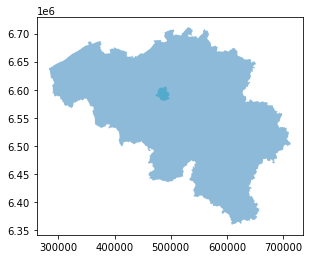

In [1063]:
all_boundaries.plot("name", alpha=0.5)

## Smur Bxl

In [1064]:
if dataset == "smur":
    starts = gpd.GeoDataFrame(columns = 
    ["name",             "address",                                      "wk_xl", "wk_dlt", "wk_stjean", "wk_none"], data=[
    ["Paul Brien",       "Av. Britsiers 5, 1030 Schaerbeek",             True,    True,    True,    True ],
    ["Saint-Pierre",     "Rue Haute 290, 1000 Bruxelles",                True,    True,    True,    True ],
    ["Sainte-Elisabeth", "Avenue De Fré 206, 1180 Uccle",                True,    True,    True,    True ],
    ["Saint-Luc",        "Avenue Hippocrate, 1200 Woluwe-Saint-Lambert", True,    True,    True,    True ],
    ["Érasme (ULB)",     "Rue Meylemeersch 56, 1070 Anderlecht",         True,    True,    True,    True ],
    ["HM",               "Rue Bruyn 1, 1120 Bruxelles",                  True,    True,    True,    True ],
    ["AZVUB",            "Avenue du Laerbeek 101, 1090 Jette",           True,    True,    True,    True ],
    ["Ixelles",          "Rue Jean Paquot 63, 1050 Ixelles",             True,    False,   False,   False],
    ["Delta",            "Boulevard du Triomphe 201, 1160 Auderghem",    False,   True,    False,   False],
    ["Saint-Jean",       "Rue du Marais 104, 1000 Bruxelles",            False,   False,   True,    False],

    ])


    subsets = ["wk_xl", "wk_dlt", "wk_stjean"] #, "wk_none"
    minute_range = list(range(16)) # list(range(21)) #[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 16, 18]
    


In [1065]:
if dataset == "smur":
    boundaries = all_boundaries[all_boundaries.name == "BRU"]
    zoom = 10.5

## Maternities

In [1066]:
if dataset == "maternity":
    starts = pd.read_csv("data/maternities.csv", usecols=["name", "address"])
    starts = gpd.GeoDataFrame(starts)

    starts["current"] = True


In [1067]:
# https://kce.fgov.be/fr/une-r%C3%A9duction-du-nombre-de-maternit%C3%A9s-est-possible-dans-notre-pays
# From https://www.google.com/maps/d/u/0/viewer?mid=1BuSrXrmRLzqMNVNLR-hSq0PL53o9GaB9&ll=50.83934807412515%2C4.471731899999895&z=9
# https://plus.lesoir.be/273299/article/2020-01-16/voici-les-17-maternites-belges-qui-pourraient-fermer-leurs-portes-carte

# AZ Sint-Jan (Ostende)
# AZ Zeno (Knokke-Heist)
# AZ Delta (Turnhout)
# Sint-Andries (Tielt)
# St. Vincentius (Deinze)
# A.Z. (Audenarde)
# AZ Delta (Menin)
# AZ Glorieux (Renaix)
# Site St-Joseph, du CHR de Mons
# CH Haute Senne, site le Tilleriau (Soignies)
# CHU André Vésale - site de Lobbes (Montigny-le-Tilleul)
# C.H. Jolimont (Lobbes)
# CHR Sambre et Meuse (Auvelais)
# Centre Hospitalier Régional de Huy
# CHC - Clinique Sainte-Elisabeth (Verviers)
# St. Nikolaus Hospital (Eupen)
# ASZ (Grammont) - déjà fermé depuis l'été
if dataset == "maternity":
    should_go_names = ["ST. JAN BRUGGE", "Zeno", "Torhout", "Tielt", "Deinze", "Oudenaarde", "Menen", "Glorieux", 
                       "CHR Mons", "Tilleriau", "Vesale", "Lobbes", "Sambre", "Huy", "VERVIERS, CENTRE HOSPITALIER CHRETIEN", 
                       "Eupen"]

    starts["future"] = starts.name.str.upper().apply(lambda x: sum([sgn.lower() in x.lower() for sgn in should_go_names]) == 0)
    assert starts[~starts.future].shape[0] ==  len(should_go_names)

    subsets = ["current", "future"]
    minute_range = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45]

In [1068]:

if dataset == "maternity":
    boundaries = all_boundaries[all_boundaries.name == "BEL"]
    zoom = 7

## Covid Vaccin

In [1069]:
if dataset == "vaccin":
    starts = gpd.GeoDataFrame(columns = 
    ["name",        "address",                                            "current", "with_WB"], data=[
    ["Pachéco",     "Boulevard Pachéco, 42, 1000 Bruxelles",               True,    True],
    ["Heysel ",     "Avenue Impératrice Charlotte, 6, 1020 Laeken",        True,    True],
    ["WSP",         "Drève des Shetlands, 15, 1150 Woluwé-Saint-Pierre",   True,    True],
    ["Schaerbeek",  "Avenue du Suffrage Universel, 1030 Schaerbeek",       True,    True],
    ["Molenbeek",   "Chaussée de Gand, 696, 1080 Molenbeek",               True,    True],
    ["Forest",      "Avenue Jupiter, 201, 1190 Forest",                    True,    True],
    ["Anderlecht",  "Avenue Théo Verbeeck, 2, 1070 Anderlecht",            True,    True],
    ["WSL",         "Avenue des Vaillants, 2, 1200 Woluwé-Saint-Lambert",  True,    True],
    ["Uccle",       "Rue Égide Van Ophem, 110, 1180 Uccle",                True,    True],
    ["HM",          "Rue Bruyn, 200 à 1120 Neder-over-Heembeek",           True,    True],
    ["Watermael",   "Boulevard du Souverain 25, 1170 Watermael-Boitsfort", False,   True]
    ])
    subsets = ["current", "with_WB"]
    minute_range = list(range(21)) #[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20]

In [1070]:
if dataset == "vaccin":
    boundaries = all_boundaries[all_boundaries.name == "BRU"]
    zoom = 10.5


## Add label

In [1071]:
starts["label"] = starts.apply(lambda row: ";".join(sb for sb in subsets if row[sb]), axis=1)
starts["label"] = starts["label"].str.replace(";".join(subsets), "all scenarii")

In [1072]:
starts

,name,address,current,future,label
0,"ARLON, VIVALIA - CLINIQUES DU SUD - LUXEMBOURG...","RUE DES DEPORTES 137, 6700 ARLON",True,True,all scenarii
1,"ATH, CENTRE HOSPITALIER EPICURA","RUE MARIA THOMEE 1, 7800 ATH",True,True,all scenarii
2,"BOUSSU, CENTRE HOSPITALIER EPICURA HORNU","ROUTE DE MONS 63, 7301 HORNU",True,True,all scenarii
3,"BRAINE,- L'ALLEUD CENTRE HOSPITALIER INTERREGI...","RUE WAYEZ 35, 1420 BRAINE - L'ALLEUD",True,True,all scenarii
4,"CHARLEROI, GRAND HOPITAL DE CHARLEROI NOTRE - ...","GRAND'RUE 3, 6000 CHARLEROI",True,True,all scenarii
...,...,...,...,...,...
97,"TURNHOUT, ALGEMEEN ZIEKENHUIS TURNHOUT Campus ...","STEENWEG OP MERKSPLAS 44, 2300 TURNHOUT",True,True,all scenarii
98,"VEURNE, AZ WEST","IEPERSE STEENWEG 100, 8630 VEURNE",True,True,all scenarii
99,"VILVOORDE, ALGEMEEN ZIEKENHUIS VILVOORDE Campu...","GENDARMERIESTRAAT 65, 1800 VILVOORDE",True,True,all scenarii
100,"WAREGEM, O.L.V. VAN LOURDES ZIEKENHUIS WAREGEM","VIJFSEWEG 150, 8790 WAREGEM",True,True,all scenarii


In [1073]:
starts.label.value_counts()

all scenarii    86
current         16
Name: label, dtype: int64

## Geocoding

In [1074]:
if not from_files:
    starts = geocode_points(starts)
    starts.to_pickle(f"data/starts_{dataset_label}.pkl.gz")
else: 
    starts = pd.read_pickle(f"data/starts_{dataset_label}.pkl.gz")
    
    # fixing a bug that makes geodataframe being loaded from pickle to be not plottable
    # after loading from pickle: starts.name.dtype is np.dtype("O") == False
    n = starts.name.str.replace("willnotappear", "").copy()
    starts = starts.drop("name", axis=1).assign(name=n)
    # after those lines : # starts.name.dtype is np.dtype("O") == True
    
starts

  0%|          | 0/102 [00:00<?, ?it/s]

,name,address,current,future,label,lat,lon,geometry
0,"ARLON, VIVALIA - CLINIQUES DU SUD - LUXEMBOURG...","RUE DES DEPORTES 137, 6700 ARLON",True,True,all scenarii,49.678868,5.821125,POINT (648004.626 6390846.012)
1,"ATH, CENTRE HOSPITALIER EPICURA","RUE MARIA THOMEE 1, 7800 ATH",True,True,all scenarii,50.634710,3.776390,POINT (420385.812 6556930.753)
2,"BOUSSU, CENTRE HOSPITALIER EPICURA HORNU","ROUTE DE MONS 63, 7301 HORNU",True,True,all scenarii,50.436300,3.831030,POINT (426468.309 6522180.995)
3,"BRAINE,- L'ALLEUD CENTRE HOSPITALIER INTERREGI...","RUE WAYEZ 35, 1420 BRAINE - L'ALLEUD",True,True,all scenarii,50.687438,4.367716,POINT (486211.966 6566190.180)
4,"CHARLEROI, GRAND HOPITAL DE CHARLEROI NOTRE - ...","GRAND'RUE 3, 6000 CHARLEROI",True,True,all scenarii,50.417620,4.453170,POINT (495724.617 6518916.870)
...,...,...,...,...,...,...,...,...
97,"TURNHOUT, ALGEMEEN ZIEKENHUIS TURNHOUT Campus ...","STEENWEG OP MERKSPLAS 44, 2300 TURNHOUT",True,True,all scenarii,51.334800,4.921820,POINT (547894.496 6680731.012)
98,"VEURNE, AZ WEST","IEPERSE STEENWEG 100, 8630 VEURNE",True,True,all scenarii,51.061840,2.667610,POINT (296956.987 6632239.801)
99,"VILVOORDE, ALGEMEEN ZIEKENHUIS VILVOORDE Campu...","GENDARMERIESTRAAT 65, 1800 VILVOORDE",True,True,all scenarii,50.927930,4.418240,POINT (491836.227 6608555.262)
100,"WAREGEM, O.L.V. VAN LOURDES ZIEKENHUIS WAREGEM","VIJFSEWEG 150, 8790 WAREGEM",True,True,all scenarii,50.899315,3.417467,POINT (380430.631 6603502.946)


In [1075]:
fig = px.scatter_mapbox(starts,
                        lat="lat",
                        lon="lon",
                        hover_name="name",
                        color='label',
                        size_max=120,
                        zoom=10,
                        mapbox_style="open-street-map",
                        #opacity=0.2
                   )

bd = boundaries.to_crs(osm_crs)
fig_bd = px.choropleth_mapbox(bd, 
                           geojson=bd.geometry, 
                           locations=bd.index, 
                           #labels="boundary",
                           #hover_name="name",
                           #fill_color="none",
                           
                           #zoom=10,
                           opacity=0.2
                   )



fig.add_trace(fig_bd.data[0])


fig.show()

# Multirange process

In [1076]:
if not from_files:
    isolines = get_isolines(starts, minute_range, add_options)
    isolines.to_pickle(f"data/isolines_{dataset_label}.pkl.gz")

else :
    isolines = pd.read_pickle(f"data/isolines_{dataset_label}.pkl.gz")
    # fixing a bug that makes geodataframe being loaded from pickle to be not plottable
    n = isolines.name.str.replace("willnotappear", "").copy()
    isolines = isolines.drop("name", axis=1).assign(name=n)
    
    
isolines


  0%|          | 0/102 [00:00<?, ?it/s]

Too many requests, wait for 15 seconds...


,name,address,current,future,label,lat,lon,range,geometry
0,"ARLON, VIVALIA - CLINIQUES DU SUD - LUXEMBOURG...","RUE DES DEPORTES 137, 6700 ARLON",True,True,all scenarii,49.678868,5.821125,0,"POLYGON ((648338.852 6392961.341, 649103.283 6..."
1,"ARLON, VIVALIA - CLINIQUES DU SUD - LUXEMBOURG...","RUE DES DEPORTES 137, 6700 ARLON",True,True,all scenarii,49.678868,5.821125,5,"POLYGON ((645587.145 6395324.843, 646045.782 6..."
2,"ARLON, VIVALIA - CLINIQUES DU SUD - LUXEMBOURG...","RUE DES DEPORTES 137, 6700 ARLON",True,True,all scenarii,49.678868,5.821125,10,"POLYGON ((633662.936 6394852.020, 637179.073 6..."
3,"ARLON, VIVALIA - CLINIQUES DU SUD - LUXEMBOURG...","RUE DES DEPORTES 137, 6700 ARLON",True,True,all scenarii,49.678868,5.821125,15,"POLYGON ((621433.042 6400526.795, 622197.362 6..."
4,"ARLON, VIVALIA - CLINIQUES DU SUD - LUXEMBOURG...","RUE DES DEPORTES 137, 6700 ARLON",True,True,all scenarii,49.678868,5.821125,20,"POLYGON ((615012.357 6413309.189, 615470.993 6..."
...,...,...,...,...,...,...,...,...,...
1015,"ZOTTEGEM, ALGEMEEN ZIEKENHUIS ST. - ELISABETH","GODVEERDEGEMSTRAAT 69, 9620 ZOTTEGEM",True,True,all scenarii,50.864240,3.816580,25,"POLYGON ((394873.722 6592420.974, 395332.359 6..."
1016,"ZOTTEGEM, ALGEMEEN ZIEKENHUIS ST. - ELISABETH","GODVEERDEGEMSTRAAT 69, 9620 ZOTTEGEM",True,True,all scenarii,50.864240,3.816580,30,"POLYGON ((387841.447 6634648.873, 390134.629 6..."
1017,"ZOTTEGEM, ALGEMEEN ZIEKENHUIS ST. - ELISABETH","GODVEERDEGEMSTRAAT 69, 9620 ZOTTEGEM",True,True,all scenarii,50.864240,3.816580,35,"POLYGON ((375611.554 6640490.519, 377904.624 6..."
1018,"ZOTTEGEM, ALGEMEEN ZIEKENHUIS ST. - ELISABETH","GODVEERDEGEMSTRAAT 69, 9620 ZOTTEGEM",True,True,all scenarii,50.864240,3.816580,40,"POLYGON ((360935.638 6648285.983, 362005.752 6..."


In [1077]:
isolines_grouped = get_isolines_grouped(isolines, subsets)
isolines_grouped

,range,geometry,subset,label
0,0,"MULTIPOLYGON (((648338.852 6392961.341, 649103...",current,current (0)
1,5,"MULTIPOLYGON (((645587.145 6395324.843, 646045...",current,current (5)
2,10,"MULTIPOLYGON (((628618.159 6561012.199, 629841...",current,current (10)
3,15,"MULTIPOLYGON (((621433.042 6400526.795, 622197...",current,current (15)
4,20,"POLYGON ((618987.061 6408809.436, 619751.450 6...",current,current (20)
5,25,"POLYGON ((624031.907 6410467.062, 624643.385 6...",current,current (25)
6,30,"POLYGON ((640389.395 6436319.348, 640542.257 6...",current,current (30)
7,35,"POLYGON ((641153.847 6439883.362, 641153.847 6...",current,current (35)
8,40,"POLYGON ((657969.992 6440358.570, 661638.971 6...",current,current (40)
9,45,"POLYGON ((683041.302 6433073.603, 684570.007 6...",current,current (45)


## Some specific plots

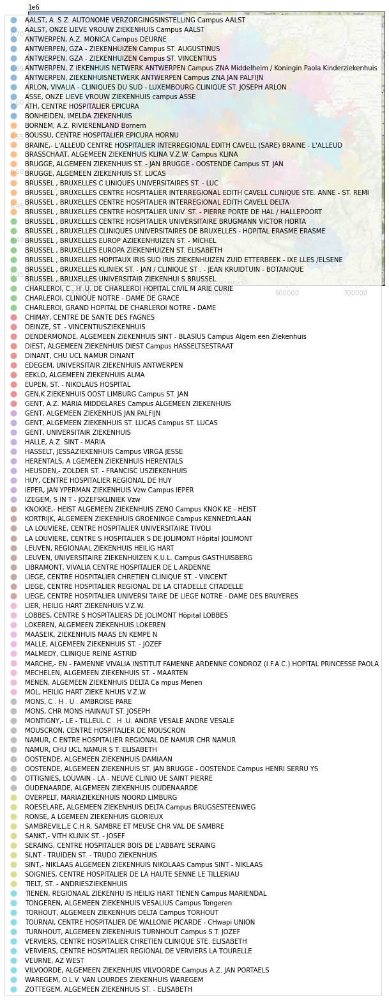

In [1078]:
ax= isolines[isolines.range == minute_range[5]].plot("name", alpha=0.5, figsize=(10, 10), legend=True)
add_basemap(ax)

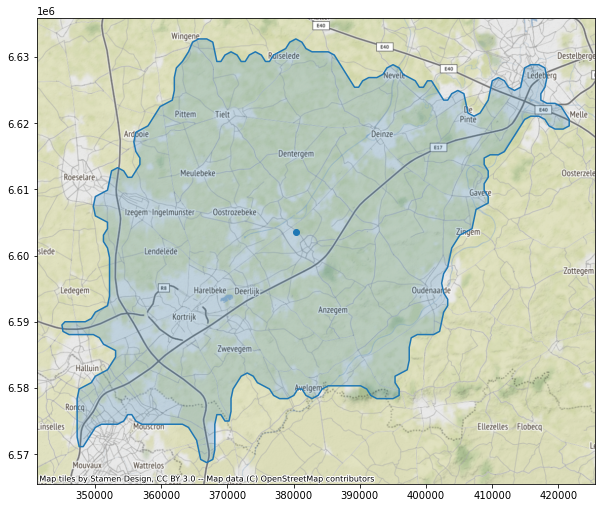

In [1079]:
start_name= starts.name.iloc[-2]
sel = isolines[(isolines.name==start_name) & (isolines.range==minute_range[5])]
ax = sel.plot(alpha=0.2, figsize=(10, 10))
ax = sel.boundary.plot(ax=ax)
starts[(starts.name==start_name)].plot(ax=ax)
add_basemap(ax)#, source=ctx.providers.OpenStreetMap.Mapnik)


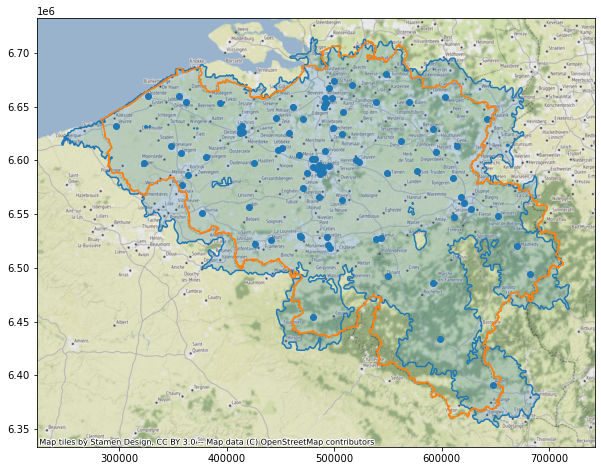

In [1080]:
sel = isolines_grouped[(isolines_grouped.range == minute_range[5]) & 
                    (isolines_grouped.subset == subsets[1])]

ax= sel.plot("label", alpha=0.2, figsize=(10, 10), legend=False)
ax = sel.boundary.plot(ax=ax)
starts[starts[subsets[1]]].plot(ax=ax)
boundaries.boundary.plot(ax=ax, color="C1")
add_basemap(ax)

In [1081]:
# ax = plot_isolines(isolines_grouped, starts, minute_range[6], boundaries)

# Static images

In [1082]:
plt.rcParams.update({'figure.max_open_warning': len(minute_range)})

In [1083]:
for r in tqdm(minute_range):
    f = plot_isolines(isolines_grouped, starts, r, boundaries)
    plt.savefig(f"{output_path}/reached_zone_{dataset_label}_{r:02}.png")
    plt.close() # Remove this line to see all plots --> might be long! 

  0%|          | 0/10 [00:00<?, ?it/s]

<AxesSubplot:title={'center':'Reached zone (maternity) - range: 25 minutes'}>

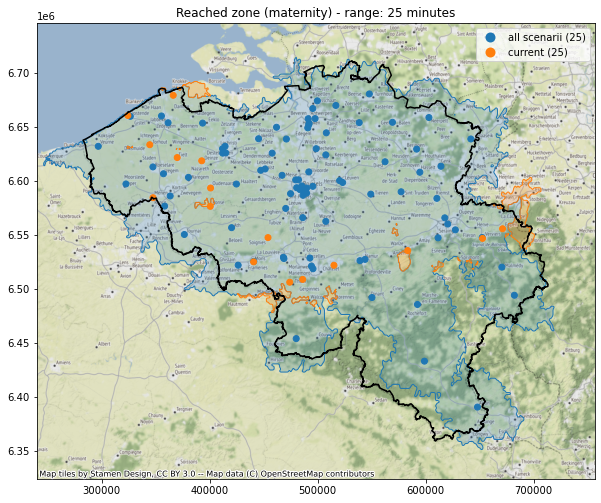

In [1084]:
plot_isolines(isolines_grouped, starts, minute_range[5], boundaries)

In [1085]:
# Make a video from PNG images - Assumes ffmpeg is installed on the machine
os.system(f"rm {output_path}/reached_zone_{dataset_label}.mp4")
os.system(f"cat {output_path}/reached_zone*.png | ffmpeg -f image2pipe -r 2 -s 950x800 -i - {output_path}/reached_zone_{dataset_label}.mp4")

0

# Dash dashboard

In [1086]:
# Build App
app = JupyterDash(__name__)
app.layout = html.Div([
    html.H1(f"Multipoint reachability ({dataset})"),
    dcc.Graph(id='graph'),
    html.Label([
        "Range",
        dcc.Slider(
            id='range-slider', 
            min=minute_range[0],
            max=minute_range[-1],
            step=None,
            marks={c: str(c) for c in minute_range},
            value=minute_range[-3]
            )
    ])
])

In [1087]:
# Define callback to update graph
@app.callback(
    Output('graph', 'figure'),
    [Input("range-slider", "value")]#, Input('traffic-radio', 'value')]
)
def update_figure(m_range):#, traffic):
    
    return plot_isolines_px(isolines_grouped, starts, m_range, boundaries)#, traffic) 



In [1088]:
ip = '10.1.0.45'
print(f"Watch outside Jupyter: http://{ip}:8050/")
app.run_server(mode='inline', debug=True, host=ip)

Watch outside Jupyter: http://10.1.0.45:8050/


/home/vandy/anaconda3/envs/gis/lib/python3.8/site-packages/jupyter_dash/jupyter_app.py:139: UserWarning:

The 'environ['werkzeug.server.shutdown']' function is deprecated and will be removed in Werkzeug 2.1.



In [1089]:
plot_isolines_px(isolines_grouped, starts, minute_range[5], boundaries)

## Reach ratio

In [1090]:
isolines_grouped_bnd = gpd.overlay(isolines_grouped, boundaries[["geometry"]], how="intersection")#.plot()

In [1091]:
isolines_grouped_bnd["reach_ratio"] = isolines_grouped_bnd.area/boundaries.area.iloc[0]

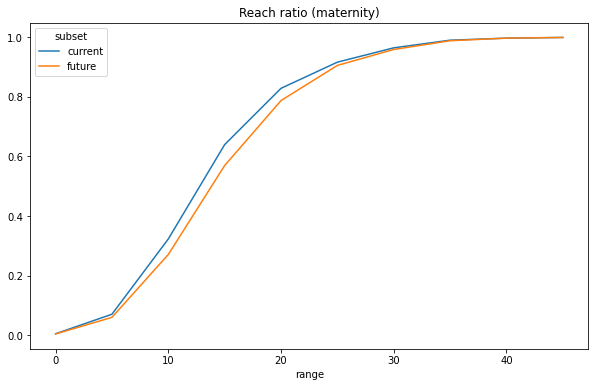

In [1092]:
pv=isolines_grouped_bnd.pivot(index="range", values="reach_ratio", columns= "subset") #["label", "traffic"])#
fig=pv.plot(figsize=(10, 6), title=f"Reach ratio ({dataset}{', '+option if option else ''})")
plt.savefig(f"{output_path}/reach_ratio_{dataset_label}.png")

In [1093]:
# With plotly
fig = px.line(pv,  title=f"Reach ratio ({dataset}{', '+option if option else ''})", 
             color_discrete_sequence=px.colors.qualitative.D3)
fig.update_layout(
    yaxis_title='Reached zone ratio',
    xaxis_title='Range (minutes)',
    title=f"Reach ratio ({dataset}{', '+option if option else ''})",
    hovermode="x",
    yaxis_tickformat= ',.2%'
)
fig.update_layout(legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    ))

fig.write_html(f"{output_path}/reach_ratio_{dataset_label}.html",  include_plotlyjs="cdn")
fig

# Population data

In [1094]:
# https://statbel.fgov.be/fr/open-data/secteurs-statistiques-2020
download_if_nexist("https://statbel.fgov.be/sites/default/files/files/opendata/Statistische%20sectoren/sh_statbel_statistical_sectors_31370_20200101.shp.zip",
                   "data/stat_sectors_2020.zip")
statistical_sectors = gpd.read_file("zip://data/stat_sectors_2020.zip/sh_statbel_statistical_sectors_20200101.shp")
statistical_sectors = statistical_sectors.to_crs(crs)

In [1095]:
#statistical_sectors.shape

In [1096]:
# https://statbel.fgov.be/fr/nouvelles/la-population-par-secteur-statistique
download_if_nexist("https://statbel.fgov.be/sites/default/files/files/opendata/bevolking/sectoren/OPENDATA_SECTOREN_2020.xlsx",
                   "data/OPENDATA_SECTOREN_2020.xlsx")
population_per_sector = pd.read_excel("data/OPENDATA_SECTOREN_2020.xlsx")

In [1097]:
pop_per_sector_geo = population_per_sector[["TX_DESCR_FR", "TX_DESCR_SECTOR_FR", "CD_SECTOR", "POPULATION"]]
pop_per_sector_geo = pop_per_sector_geo.merge(statistical_sectors[["CS01012020", "geometry"]].rename({"CS01012020":"CD_SECTOR"}, axis=1)).set_geometry("geometry")

<AxesSubplot:>

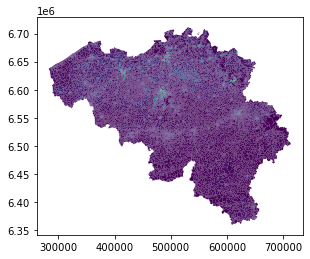

In [1098]:
pop_per_sector_geo.plot("POPULATION")

In [1099]:
# Keep only sector within boundaries
pop_per_sector_geo = gpd.sjoin(pop_per_sector_geo, boundaries.buffer(100).reset_index().set_geometry(0), op="within")


In [1100]:
# pop_per_sector_geo.POPULATION.sort_values()

In [1101]:
# pop_per_sector_geo.area.sort_values().astype(int)#.hist()

<AxesSubplot:>

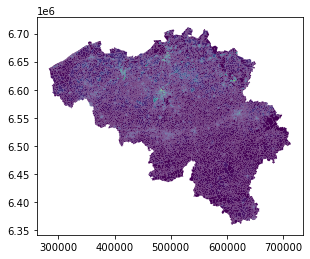

In [1102]:
pop_per_sector_geo.plot("POPULATION")

In [1103]:
# isolines_grouped_bnd.assign(geometry=isolines_grouped_bnd.buffer(10))

In [1104]:
security_buffer = 10

In [1105]:
isolines_grouped_pop = isolines_grouped_bnd
for op in ['intersects', 'contains']:
    isolines_grouped_op = gpd.sjoin(
                                    #isolines_grouped_bnd[["subset", "range", "geometry"]], 
                                    isolines_grouped_bnd.assign(geometry=isolines_grouped_bnd.buffer(security_buffer))[["subset", "range", "geometry"]], 
                                    pop_per_sector_geo[["geometry", "POPULATION"]],
                                    op=op)
    isolines_grouped_op = isolines_grouped_op.groupby(["subset", "range"]).POPULATION.sum().rename("POP_"+op).reset_index()
    
    isolines_grouped_pop = isolines_grouped_pop.merge(isolines_grouped_op, how="left")
isolines_grouped_pop

,range,subset,label,geometry,reach_ratio,POP_intersects,POP_contains
0,0,current,current (0),MULTIPOLYGON Z (((681818.300 6495679.552 0.000...,0.005067,1307757,123238
1,5,current,current (5),MULTIPOLYGON Z (((678607.957 6498072.394 0.000...,0.070556,4492353,2899509
2,10,current,current (10),MULTIPOLYGON Z (((672798.750 6499508.292 0.000...,0.323058,8356684,6725099
3,15,current,current (15),MULTIPOLYGON Z (((574959.381 6423264.520 0.000...,0.639729,10587197,9646196
4,20,current,current (20),MULTIPOLYGON Z (((618987.061 6408809.436 0.000...,0.828666,11227765,10994006
5,25,current,current (25),MULTIPOLYGON Z (((624031.907 6410467.062 0.000...,0.916413,11401547,11313924
6,30,current,current (30),"POLYGON Z ((640389.395 6436319.348 0.000, 6405...",0.964472,11461462,11419950
7,35,current,current (35),"POLYGON Z ((641153.847 6439883.362 0.000, 6411...",0.990151,11479458,11456013
8,40,current,current (40),"POLYGON Z ((591306.142 6379721.671 0.000, 5928...",0.997011,11482191,11466204
9,45,current,current (45),"POLYGON Z ((297225.188 6646336.332 0.000, 2984...",0.999273,11483092,11467538


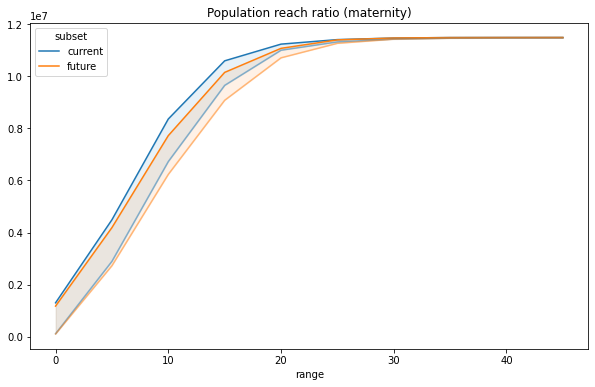

In [1106]:
pv_pop_max=isolines_grouped_pop.pivot(index="range", values="POP_intersects", columns= "subset").fillna(0) #["label", "traffic"])#
pv_pop_min=isolines_grouped_pop.pivot(index="range", values="POP_contains", columns= "subset").fillna(0) #["label", "traffic"])#


ax = pv_pop_max.plot(figsize=(10, 6), title=f"Population reach ratio ({dataset}{', '+option if option else ''})")
pv_pop_min.fillna(0).plot(ax=ax, alpha=0.5, color=["C0", "C1", "C2", "C3"], legend=False)

for c in range(pv_pop_min.shape[1]):
    ax.fill_between(pv_pop_max.index, pv_pop_max.iloc[:,c], pv_pop_min.iloc[:,c], color=f"C{c}", alpha=0.1)
plt.savefig(f"{output_path}/pop_reach_ratio_{dataset_label}.png") #set_index("label", "range").reach_ratio.plot()


In [1107]:
isolines_grouped_pop

,range,subset,label,geometry,reach_ratio,POP_intersects,POP_contains
0,0,current,current (0),MULTIPOLYGON Z (((681818.300 6495679.552 0.000...,0.005067,1307757,123238
1,5,current,current (5),MULTIPOLYGON Z (((678607.957 6498072.394 0.000...,0.070556,4492353,2899509
2,10,current,current (10),MULTIPOLYGON Z (((672798.750 6499508.292 0.000...,0.323058,8356684,6725099
3,15,current,current (15),MULTIPOLYGON Z (((574959.381 6423264.520 0.000...,0.639729,10587197,9646196
4,20,current,current (20),MULTIPOLYGON Z (((618987.061 6408809.436 0.000...,0.828666,11227765,10994006
5,25,current,current (25),MULTIPOLYGON Z (((624031.907 6410467.062 0.000...,0.916413,11401547,11313924
6,30,current,current (30),"POLYGON Z ((640389.395 6436319.348 0.000, 6405...",0.964472,11461462,11419950
7,35,current,current (35),"POLYGON Z ((641153.847 6439883.362 0.000, 6411...",0.990151,11479458,11456013
8,40,current,current (40),"POLYGON Z ((591306.142 6379721.671 0.000, 5928...",0.997011,11482191,11466204
9,45,current,current (45),"POLYGON Z ((297225.188 6646336.332 0.000, 2984...",0.999273,11483092,11467538


## Beter average

In [1108]:
nb_levels=5

geo_df_levels = None

def get_crossed_sectors(geo_df, shape):
    """
    Compute which polygons of geo_df are crossed by shape

    Parameters
    ----------
    geo_df: geopandas.GeoDataFrame
       a GeoDataFrame with a string column "CD_SECTOR" 
    shape: shapely.geometry.linestring.LineString
       a line corresponding typically to a geofg.loc[i].geometry.boundary
       
    Returns
    -------

    pd.Series of boolean, with geo_df.shape[0] rows
    """

    # Simple version. Might be very long, especially for "maternity" use case 
    # return pop_per_sector_geo.geometry.crosses(shape)

    # Hierarchical version. Should be much more efficient
    # First tries to see which high level boundaries such as provinces are crossed by "shape". 
    # Then, only within those "crossed" provinces, see which districts are crossed by "shape", ..., down to statistical sectors
    
    global geo_df_levels
    if geo_df_levels is None:
        geo_df_levels = multilevel_split(geo_df)
    
    ppsg = geo_df_levels[0]
    
    for i in tqdm(range(nb_levels), leave=False):
        crosses = ppsg.geometry.crosses(shape)

        ppsg = ppsg[crosses]
        if i < nb_levels-1:
            ppsg = gpd.GeoDataFrame(ppsg[[f"CD_{i}"]].merge(geo_df_levels[i+1]))

    return geo_df.CD_SECTOR.isin(ppsg[f"CD_{nb_levels-1}"])


In [1109]:
# Multilevels
# Group sectors in several levels of larger sections

def multilevel_split(geo_df):
    geo_df = geo_df.assign(CD_0 = geo_df.CD_SECTOR.str[0:2],
                           CD_1 = geo_df.CD_SECTOR.str[0:4],
                           CD_2 = geo_df.CD_SECTOR.str[0:6],
                           CD_3 = geo_df.CD_SECTOR.str[0:7],
                           CD_4 = geo_df.CD_SECTOR)

    geo_df_levels= {}
    for i in tqdm(range(nb_levels), leave=False, desc="Getting multilevel split..."):
        df = geo_df.dissolve(f"CD_{i}")[["geometry"]].reset_index()
        if i > 0:
            df = df.merge(geo_df[[f"CD_{i-1}", f"CD_{i}"]].drop_duplicates()) 
        geo_df_levels[i] = df
    return geo_df_levels

In [ ]:
if from_files:
    isolines_grouped_pop = pd.read_pickle(f"data/isolines_reach_pop_{dataset_label}.pkl.gz")
else: 
    
    
    for i in tqdm(isolines_grouped_pop.index):
        isoline_sel=isolines_grouped_pop.loc[i].geometry
    #     crosses = pop_per_sector_geo.simplify(1000).geometry.crosses(isoline_sel.simplify(1000).boundary)
        crosses = get_crossed_sectors(pop_per_sector_geo, isoline_sel.buffer(security_buffer).boundary)

        isolines_grouped_pop.loc[i, "POP_crossed"] = pop_per_sector_geo[crosses].POPULATION.sum()
        common_part = pop_per_sector_geo[crosses].intersection(isoline_sel)#.plot()
        covered_ratio = common_part.area / pop_per_sector_geo[crosses].area
        covered_pop = int((pop_per_sector_geo[crosses].POPULATION * covered_ratio).sum())

        isolines_grouped_pop.loc[i, "POP_mean"] = isolines_grouped_pop.POP_contains.fillna(0).loc[i] + covered_pop
    isolines_grouped_pop.to_pickle(f"data/isolines_reach_pop_{dataset_label}.pkl.gz")

  0%|          | 0/20 [00:00<?, ?it/s]

Getting multilevel split...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
# Solid line: assumes population is uniformly spread accross all sectors
# Top fill: assumes we reach all the population of a sector as soon as the isolines cross the sector (best case assumption)
# Bottom fill: assumes we reach no one in a sector before the full sector is included in the isoline (worst case assumption)

pv_pop_max= isolines_grouped_pop.pivot(index="range", values="POP_intersects", columns= "subset").fillna(0) / pop_per_sector_geo.POPULATION.sum()
pv_pop_min= isolines_grouped_pop.pivot(index="range", values="POP_contains",   columns= "subset").fillna(0) / pop_per_sector_geo.POPULATION.sum()
pv_pop_mean=isolines_grouped_pop.pivot(index="range", values="POP_mean",       columns= "subset").fillna(0) / pop_per_sector_geo.POPULATION.sum()

In [ ]:
# With Matplotlib
ax = pv_pop_mean.plot(figsize=(10, 6), title=f"Population reach ratio ({dataset}{', '+option if option else ''})") #set_index("label", "range").reach_ratio.plot()

for c in range(pv_pop_mean.shape[1]):
     ax.fill_between(pv_pop_max.index, pv_pop_max.iloc[:,c], pv_pop_min.iloc[:,c], color=f"C{c}", alpha=0.1)
plt.savefig(f"{output_path}/pop_reach_mean_ratio_{dataset_label}.png") #set_index("label", "range").reach_ratio.plot()

In [ ]:
# With Plotly express
fig = go.Figure()
for subs, color in zip(pv_pop_mean.columns[::-1], ["44, 160, 44", "255, 127, 14",  "31, 119, 180", "255,0,0"]):
    
    fig.add_trace(
        go.Scatter(
            name=f'{subs} (mean)',
            x=pv_pop_mean.index,
            y=pv_pop_mean[subs],
            mode='lines',
            line=dict(color=f'rgb({color})'),
        ))
    fig.add_trace(    go.Scatter(
            name=f'{subs} (UB)',
            x=pv_pop_max.index,
            y=pv_pop_max[subs],
            mode='lines',
            marker=dict(color=f'rgb({color})'),
            line=dict(width=0),
            showlegend=False
        ))#,
    fig.add_trace(    go.Scatter(
            name=f'{subs} (LB)',
            x=pv_pop_min.index,
            y=pv_pop_min[subs],
            marker=dict(color=f'rgb({color})'),
            line=dict(width=0),
            mode='lines',
            fillcolor=f'rgba({color}, 0.2)',
       
            fill='tonexty',
            showlegend=False
        ))
# ])
fig.update_layout(
    yaxis_title='Reached population (ratio)',
    xaxis_title='Range (minutes)',
    title=f"Population reach ratio ({dataset}{', '+option if option else ''})",
    hovermode="x",
    yaxis_tickformat= ',.2%',
)

fig.update_layout(legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    ))
fig.show()
fig.write_html(f"{output_path}/pop_reach_mean_ratio_{dataset_label}.html",include_plotlyjs="cdn" ) #set_index("label", "range").reach_ratio.plot()

## Plots for blog


In [ ]:
# Works for "Vaccin", no traffic

if dataset == "vaccin" and option is None:
    aud_wb = statistical_sectors[statistical_sectors.T_MUN_FR.isin(["Auderghem", "Watermael-Boitsfort"])].copy()
    il = isolines[(isolines.name == "Watermael") & (isolines.range==3)]


    aud_wb["color"] = "red"
    aud_wb.loc[aud_wb.crosses(il.boundary.iloc[0]), "color"] ="orange"
    aud_wb.loc[aud_wb.within(il.iloc[0].geometry), "color"] ="green"

    ax = aud_wb.plot(figsize=(10,10), edgecolor="black", color=aud_wb.color, alpha=0.2)


    il.boundary.plot(ax=ax, color="blue")
    plt.axis('off')
    plt.savefig(f"{output_path}/crosses.png")

In [ ]:
def get_osm_polyg(name):
    url = f"http://nominatim.openstreetmap.org/search.php?q={name}&format=json&limit=1&polygon_geojson=1"
    with urllib.request.urlopen(url) as response:
        return shape(json.loads(response.read())[0]["geojson"])

foret = get_osm_polyg("Foret+de+Soignes")
bxl = get_osm_polyg("Bruxelles-Capitale")
inters = bxl.intersection(foret)
df =  gpd.GeoDataFrame([{"name":"Forêt de Soignes", "geometry": foret},
                        {"name":"Bruxelles", "geometry": bxl},
                        {"name":"Intersection", "geometry": inters}])
df = df.set_geometry("geometry")
df.crs = osm_crs 
df.plot("name", legend=True)
print(f"Proportion of 'Forêt de Soignes' in Brussels: {inters.area/bxl.area:.02%}")